In [1]:
import pandas as pd
import numpy as np
from ScanImageTiffReader import ScanImageTiffReader
import os
import matplotlib.pyplot as plt
import scipy.signal
import tifffile
from scipy.signal import butter, lfilter,find_peaks, convolve
from scipy.signal.windows import gaussian
from ibllib.io.video import *
import scipy.ndimage
import cv2
from matplotlib.animation import FuncAnimation, FFMpegWriter
from IPython.display import HTML
from matplotlib.animation import PillowWriter
from ScanImageTiffReader import ScanImageTiffReader
import json
from murphlib.caimage import *
from murphlib.tools import *
from murphlib.plotting import *
from murphlib.regression import *
from sklearn.decomposition import PCA
from sklearn.metrics import explained_variance_score
from scipy.stats import zscore
import scipy.io
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import fcluster
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score
import seaborn as sns
plt.rcParams['animation.ffmpeg_path'] = r'D:\ffmpeg\bin\ffmpeg.exe'

c:\Users\dirk\anaconda3\envs\ibl\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
atlas_template = np.load(r'Z:\TM_Lab\Edward\Cerebellum_Imaging\Pcp2-jgcamp8m\Registration\atlas_slice_horizontal_20251012_153742.npy')
atlas_template = np.flip(atlas_template, axis=0)
plt.imshow(atlas_template[999:1230, 199:940], cmap='gray')
np.save(r'Z:\TM_Lab\Edward\Cerebellum_Imaging\Pcp2-jgcamp8m\Registration\atlas_template_slice8pt8.npy', atlas_template)

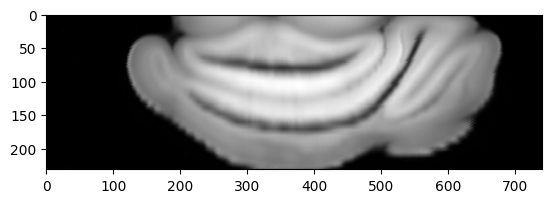

In [2]:
atlas_template = np.load(r'I:\Cerebellum_imaging_Dec2025\Registration\atlas_template_slice51.npy')
atlas_template = atlas_template[999:1230, 199:940]
plt.imshow(atlas_template, cmap='gray')

In [ ]:
tv = np.load(r'D:\Lab_Analysis\allenCCF\template_volume_10um.npy')
atlas_template = create_angled_slice(
        tv, 
        pitch_angle=5.8,  # 15 degrees nose down
        roll_angle=-9.4,     # roll along ant-post axis, + rolls to the left
        slice_height=34
    )
atlas_template = atlas_template[999:1230, 199:940]
plt.imshow(atlas_template,cmap='gray')

In [3]:
mouse_path = r'I:\Cerebellum_imaging_Dec2025\AE_L2'
subdir = [d for d in os.listdir(mouse_path)]
dates = [s for s in subdir if (
    s.isdigit() or 
    s.endswith('_valvesilent') and s.replace('_valvesilent', '').isdigit() or
    s.endswith('_valvesilent_punishsilent') and s.replace('_valvesilent_punishsilent', '').isdigit()
)]
print(dates)
# dates = [
#     '20250710_valvesilent',
    
# ]
    
model_file_name = 'ridge_model_with_bootstrap_with_roi_motion_no_pupil_wheel.npy'       
mouse_data = {key: {} for key in dates}
for date in dates:
    session_path = os.path.join(mouse_path, date)
    bhv_path = os.path.join(session_path, 'behavior')
    facemap_folder = os.path.join(bhv_path, 'raw_video_data')
    subdir = [d for d in os.listdir(session_path)]
    if 'arm1' in subdir:
        arm1_img_path = os.path.join(session_path, 'arm1')
        arm1_stat = get_stat_with_coord(arm1_img_path)
        arm1_ridge_model = np.load(os.path.join(arm1_img_path, model_file_name), allow_pickle=True)
        predictors = arm1_ridge_model[0]['predictors']
        unique_predictors = arm1_ridge_model[0]['unique_predictors']
        arm1_stat = attach_reg_model_to_stat(arm1_stat, arm1_ridge_model)
        mouse_data[date]['arm1'] = np.array(arm1_stat, dtype=object)

    if 'arm2' in subdir:
        arm2_img_path = os.path.join(session_path, 'arm2')
        arm2_stat = get_stat_with_coord(arm2_img_path)
        arm2_ridge_model = np.load(os.path.join(arm2_img_path, model_file_name), allow_pickle=True)
        predictors = arm2_ridge_model[0]['predictors']
        unique_predictors = arm2_ridge_model[0]['unique_predictors']
        arm2_stat = attach_reg_model_to_stat(arm2_stat, arm2_ridge_model)
        mouse_data[date]['arm2'] = np.array(arm2_stat, dtype=object)
    try:
        mouse_data[date]['pupil_area'] = np.load(os.path.join(facemap_folder, 'pupil_area.npy'))
        mouse_data[date]['pupil_xpos'] = np.load(os.path.join(facemap_folder, 'pupil_xpos.npy'))
        mouse_data[date]['pupil_ypos'] = np.load(os.path.join(facemap_folder, 'pupil_ypos.npy'))
        mouse_data[date]['body_motion'] = np.load(os.path.join(facemap_folder, 'bodymotion_svd.npy'))
        mouse_data[date]['face_motion'] = np.load(os.path.join(facemap_folder, 'facemotion_svd.npy'))
        mouse_data[date]['lick'] = np.load(os.path.join(facemap_folder, 'lickmotion_svd.npy'))
    except:
        facemap_out = np.load(os.path.join(facemap_folder, '_iblrig_leftCamera.raw_proc.npy'), allow_pickle=True).item()
        np.save(os.path.join(facemap_folder, 'pupil_area'), facemap_out['pupil'][0]['area_smooth'])
        np.save(os.path.join(facemap_folder, 'pupil_xpos'), facemap_out['pupil'][0]['com'][:,0])
        np.save(os.path.join(facemap_folder, 'pupil_ypos'), facemap_out['pupil'][0]['com'][:,1])
        np.save(os.path.join(facemap_folder, 'bodymotion_svd'), facemap_out['motSVD'][1])
        np.save(os.path.join(facemap_folder, 'lickmotion_svd'), facemap_out['motSVD'][2])
        np.save(os.path.join(facemap_folder, 'facemotion_svd'), facemap_out['motSVD'][3])
        mouse_data[date]['pupil_area'] = np.load(os.path.join(facemap_folder, 'pupil_area.npy'))
        mouse_data[date]['pupil_xpos'] = np.load(os.path.join(facemap_folder, 'pupil_xpos.npy'))
        mouse_data[date]['pupil_ypos'] = np.load(os.path.join(facemap_folder, 'pupil_ypos.npy'))
        mouse_data[date]['body_motion'] = np.load(os.path.join(facemap_folder, 'bodymotion_svd.npy'))
        mouse_data[date]['face_motion'] = np.load(os.path.join(facemap_folder, 'facemotion_svd.npy'))
        mouse_data[date]['lick'] = np.load(os.path.join(facemap_folder, 'lickmotion_svd.npy'))
mouse_id = mouse_path.split('\\')[-1]
os.makedirs(os.path.join(mouse_path, 'figures'), exist_ok=True)
    

['20250612', '20250624_valvesilent', '20250701_valvesilent', '20250708_valvesilent', '20250715_valvesilent', '20250729_valvesilent', '20250814_valvesilent_punishsilent', '20250821_valvesilent_punishsilent']


In [4]:
evs = [mouse_data['20250612']['arm1'][i]['explained_variance'] for i in range(len(mouse_data['20250612']['arm1'])) ]

In [6]:
evs

[np.float64(0.14932910029413948),
 np.float64(0.0705797225850131),
 np.float64(0.10520170167654774),
 np.float64(0.0410132193319136),
 np.float64(0.0856444877612339),
 np.float64(0.14482134995312623),
 np.float64(0.09244808891191603),
 np.float64(0.09803985978878449),
 np.float64(0.014730223278100918),
 np.float64(0.03482252964104349),
 np.float64(0.019394791530587097),
 np.float64(0.04002672438253552),
 np.float64(0.14137355798339235),
 np.float64(0.023237709863360156),
 np.float64(0.09703401274349466),
 np.float64(0.025679271938459536),
 np.float64(0.024949739109022206),
 np.float64(0.08179607279571555),
 np.float64(0.029156944018729147),
 np.float64(0.005205576099764797),
 np.float64(0.09039404652570704),
 np.float64(0.06576298319301199),
 np.float64(0.0732089556284774),
 np.float64(0.038218895078831694),
 np.float64(0.03203218965257315),
 np.float64(0.08565819692305521),
 np.float64(0.09403720425813022),
 np.float64(0.07563413521182039),
 np.float64(0.11003313476241816),
 np.float6

Attach PSTH with defined window and extract event variable beta to mouse_data

In [4]:
psth_time_start = -0.4
psth_time_end = 1.2
event_preds = unique_predictors[:15]
for predi, pred in enumerate(event_preds):
    pred_idx = [i for i, name in enumerate(predictors) if pred in name]
    for dayi, date in enumerate(dates):
        session_path = os.path.join(mouse_path, date)
        
        if 'arm1' in mouse_data[date]:
            
            stat = mouse_data[date]['arm1']
            arm1_img_path = os.path.join(session_path, 'arm1')
            arm1_table_for_img = pd.read_csv(arm1_img_path+'\\table_for_img.csv')
            with open(os.path.join(arm1_img_path, 'ca_img_wholefile_metadata.json'), 'r') as json_file:
                arm1_img_meta = json.load(json_file)
            frame_rate_arm1 = arm1_img_meta['SI.hRoiManager.scanFrameRate']
            arm1_dff = np.load(os.path.join(arm1_img_path, 'dff_moving_percentile_pc_lowpass_0p5hz.npy'))    
            tf_arm1_table_for_img = pd.read_csv(arm1_img_path+'\\table_for_regression.csv')
            # tf_arm1_table_for_img = transform_trial_table(arm1_table_for_img, valve_silent = 'valvesilent' in session_path, 
            #                                               punish_silent = 'punishsilent' in session_path)
            #tf_arm1_table_for_img = tf_arm1_table_for_img[tf_arm1_table_for_img['choice']==-1]
            psth_frame_idx = find_frame_indices(tf_arm1_table_for_img, frame_rate_arm1, 
                                                (psth_time_start, psth_time_end), pred).astype(int)
            if len(psth_frame_idx) != 0:
                all_psth = get_trial_PSTH(arm1_dff, psth_frame_idx, zscore=False)
                mean_psth = np.mean(all_psth, axis=0)
                mean_psth = zscore(mean_psth, axis=1)
                for i, neuron in enumerate(mouse_data[date]['arm1']):
                    beta = zscore(neuron['beta'][pred_idx])
                    psth = mean_psth[i,:]
                    neuron[pred+'_beta'] = beta
                    neuron[pred+'_psth'] = psth
        if 'arm2' in mouse_data[date]:
            
            stat = mouse_data[date]['arm2']
            arm2_img_path = os.path.join(session_path, 'arm2')
            arm2_table_for_img = pd.read_csv(arm2_img_path+'\\table_for_img.csv')
            with open(os.path.join(arm2_img_path, 'ca_img_wholefile_metadata.json'), 'r') as json_file:
                arm2_img_meta = json.load(json_file)
            frame_rate_arm2 = arm2_img_meta['SI.hRoiManager.scanFrameRate']
            arm2_dff = np.load(os.path.join(arm2_img_path, 'dff_moving_percentile_pc_lowpass_0p5hz.npy'))    

            tf_arm2_table_for_img = pd.read_csv(arm2_img_path+'\\table_for_regression.csv')
            #tf_arm2_table_for_img = tf_arm2_table_for_img[tf_arm2_table_for_img['choice']==-1]
            psth_frame_idx = find_frame_indices(tf_arm2_table_for_img, frame_rate_arm2, 
                                                (psth_time_start, psth_time_end), pred).astype(int)
            if len(psth_frame_idx) != 0:
                all_psth = get_trial_PSTH(arm2_dff, psth_frame_idx, zscore=False)
                mean_psth = np.mean(all_psth, axis=0)
                mean_psth = zscore(mean_psth, axis=1)
                for i, neuron in enumerate(mouse_data[date]['arm2']):
                    beta = zscore(neuron['beta'][pred_idx])
                    psth = mean_psth[i,:]
                    neuron[pred+'_beta'] = beta
                    neuron[pred+'_psth'] = psth

In [6]:
tf_arm1_table_for_img['vis_right_choice_times']

0        NaN
1        NaN
2      263.0
3        NaN
4      445.0
       ...  
249      NaN
250      NaN
251      NaN
252      NaN
253      NaN
Name: vis_right_choice_times, Length: 254, dtype: float64

In [6]:
vis_reward_trials = np.where(tf_arm1_table_for_img['vis_reward_times']>0)[0]
np.array(tf_arm1_table_for_img.loc[vis_reward_trials,'vis_reward_times']-tf_arm1_table_for_img.loc[vis_reward_trials,'feedback_times'])

array([ 1.,  2.,  3.,  4.,  2.,  3.,  1.,  1.,  2.,  1.,  1.,  2.,  1.,
        1.,  1.,  2.,  1.,  1.,  2.,  2.,  3.,  6.,  2.,  1.,  1.,  3.,
        2., 10.,  1.,  1.,  1.,  1.,  3.,  2.,  2.,  3.,  2.,  3.,  2.,
        3.,  1.,  1.,  3., 32.,  2.,  2.,  2.,  2.,  1.,  3.,  1.,  2.,
        4.,  3.,  2.,  3.,  1.,  2.,  2.,  3.,  2.,  2.,  3.,  3.,  5.,
        2.])

In [13]:
#tf_arm2_table_for_img = tf_arm2_table_for_img[tf_arm2_table_for_img['choice']==-1]
tf_arm2_table_for_img['firstMovement_times']

0        946.0
1       1282.0
2       1580.0
3       1677.0
4       1883.0
        ...   
257    44915.0
258    45184.0
259    45276.0
260    45684.0
261    46065.0
Name: firstMovement_times, Length: 262, dtype: float64

In [4]:
unique_predictors

['vis_ruleCue_times',
 'aud_ruleCue_times',
 'left_vis_stimOn_times',
 'right_vis_stimOn_times',
 'left_aud_stimOn_times',
 'right_aud_stimOn_times',
 'vis_left_choice_times',
 'vis_right_choice_times',
 'aud_left_choice_times',
 'aud_right_choice_times',
 'vis_reward_times',
 'aud_reward_times',
 'vis_punish_times',
 'aud_punish_times',
 'omission_times',
 'previous_feedbackType',
 'reward_history',
 'body',
 'lick',
 'face',
 'pupil_area',
 'pupil_xpos',
 'pupil_ypos',
 'vel']

In [10]:
pred_idx = [i for i, name in enumerate(predictors) if 'vis_reward' in name]

In [11]:
pred_idx

[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65]

In [9]:
os.makedirs(os.path.join(mouse_path, 'figures', 'rrr_beta_vel_choice'), exist_ok=True)
event_preds = unique_predictors[:12]
rows, cols = grid_shape(len(dates)) # change this
for pred in event_preds:
    pred_idx = [i for i, name in enumerate(predictors) if pred in name]
    unique_pred_idx = unique_predictors.index(pred)
    fig, axes = plt.subplots(rows,cols,figsize = (30,15))
    fig.suptitle(mouse_id + ' ' + pred, fontsize=30)
    for dayi, date in enumerate(dates[:1]):
        
        axes[dayi//cols, dayi%cols].imshow(atlas_template,cmap='gray')
        axes[dayi//cols, dayi%cols].set_title(date, fontsize = 30)
        axes[dayi//cols, dayi%cols].set_xticks([])
        axes[dayi//cols, dayi%cols].set_yticks([])
        if 'arm1' in mouse_data[date]:
            for i, neuron in enumerate(mouse_data[date]['arm1']):
                resp_beta = np.mean(neuron['beta'][pred_idx])
                # p_value = neuron['bootstrap_p_value'][unique_pred_idx]
                # color = 'gray' if p_value > 0.05 else resp_beta  # Gray for non-significant, R² for significant
                color = resp_beta
                #print(resp_beta)
                axes[dayi//cols, dayi%cols].scatter(neuron['xcoord_atlas'], neuron['ycoord_atlas'], 
                                              c=color if color == 'gray' else np.repeat(resp_beta,len(neuron['xcoord_atlas'])), 
                                              cmap='coolwarm', vmin = -0.02, vmax = 0.02, s=0.001)
        if 'arm2' in mouse_data[date]:
            for i, neuron in enumerate(mouse_data[date]['arm2']):
                resp_beta = np.mean(neuron['beta'][pred_idx])
                # p_value = neuron['bootstrap_p_value'][unique_pred_idx]
                # color = 'gray' if p_value > 0.05 else resp_beta  # Gray for non-significant, R² for significant
                color = resp_beta
                #print(resp_beta)
                axes[dayi//cols, dayi%cols].scatter(neuron['xcoord_atlas'], neuron['ycoord_atlas'], 
                                              c=color if color == 'gray' else np.repeat(resp_beta,len(neuron['xcoord_atlas'])), 
                                              cmap='coolwarm', vmin = -0.02, vmax = 0.02, s=0.001)
    fig.tight_layout()
    fig.savefig(os.path.join(mouse_path, 'figures', 'rrr_beta_vel_choice', 'ridge_beta_'+ pred + '_topo.png'),
                dpi=300,               # High resolution for publication
                bbox_inches='tight',   # Prevent clipping
                )
    plt.close(fig)
    

In [7]:
whole_preds = unique_predictors[15:17]
cont_preds = unique_predictors[17:]
rows, cols = grid_shape(len(dates)) # change this
for pred in whole_preds+cont_preds:
    pred_idx = [i for i, name in enumerate(predictors) if pred in name]
    print('num pred: '+ str(len(pred_idx)) + ' ' + pred)
    fig, axes = plt.subplots(rows,cols,figsize = (30,15))
    fig.suptitle(mouse_id + ' ' + pred, fontsize=30)
    for dayi, date in enumerate(dates):
        
        axes[dayi//cols, dayi%cols].imshow(atlas_template,cmap='gray')
        axes[dayi//cols, dayi%cols].set_title(date, fontsize=30)
        axes[dayi//cols, dayi%cols].set_xticks([])
        axes[dayi//cols, dayi%cols].set_yticks([])
        if 'arm1' in mouse_data[date]:
            for i, neuron in enumerate(mouse_data[date]['arm1']):
                #beta = zscore(neuron['beta'][pred_idx])
                #midpoint = (len(beta)+1)//2
                #resp_beta = np.mean(beta[midpoint:midpoint+int(0.4*15)])
                resp_beta = np.mean(neuron['beta'][pred_idx])
                #print(resp_beta)
                axes[dayi//cols, dayi%cols].scatter(neuron['xcoord_atlas'], neuron['ycoord_atlas'], c=np.repeat(resp_beta,len(neuron['xcoord_atlas'])), cmap='coolwarm', vmin = -0.01, vmax = 0.01, s=0.001)
        if 'arm2' in mouse_data[date]:
            for i, neuron in enumerate(mouse_data[date]['arm2']):
                #beta = zscore(neuron['beta'][pred_idx])
                #midpoint = (len(beta)+1)//2
                #resp_beta = np.mean(beta[midpoint:midpoint+int(0.4*15)])
                resp_beta = np.mean(neuron['beta'][pred_idx])
                #print(resp_beta)
                axes[dayi//cols, dayi%cols].scatter(neuron['xcoord_atlas'], neuron['ycoord_atlas'], c=np.repeat(resp_beta,len(neuron['xcoord_atlas'])), cmap='coolwarm', vmin = -0.01, vmax = 0.01, s=0.001)
    fig.tight_layout()
    fig.savefig(os.path.join(mouse_path, 'figures', 'bootstrap_beta_vel_choice', 'ridge_beta_'+ pred + '_topo.png'),
                dpi=300,               # High resolution for publication
                bbox_inches='tight',   # Prevent clipping
                )
    plt.close(fig)

num pred: 1 previous_feedbackType
num pred: 1 reward_history
num pred: 50 body
num pred: 10 lick
num pred: 50 face
num pred: 1 pupil_area
num pred: 1 pupil_xpos
num pred: 1 pupil_ypos
num pred: 1 vel


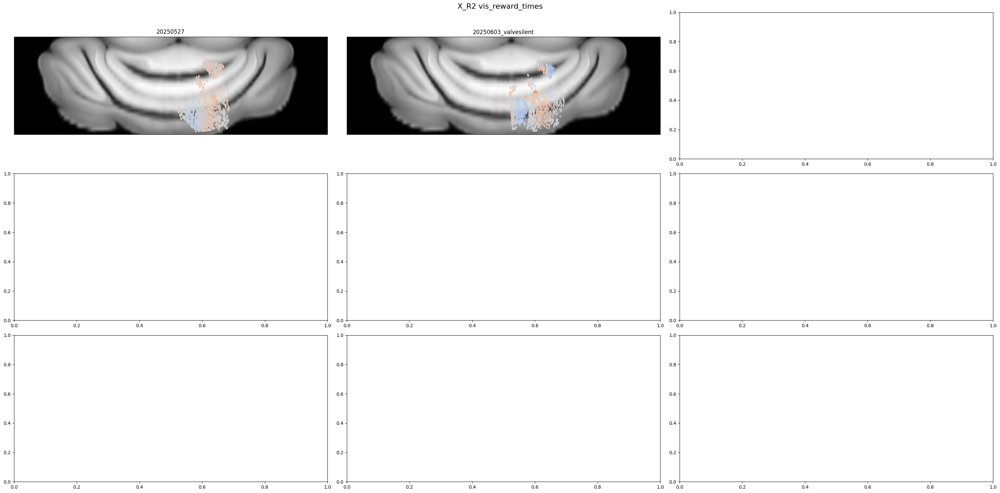

In [7]:
pred = unique_predictors[6]
pred_idx = [i for i, name in enumerate(predictors) if pred in name]

fig, axes = plt.subplots(3,3,figsize = (30,15))
fig.suptitle(mouse_id + ' ' + pred, fontsize=16)
for dayi, date in enumerate(dates):
    
    axes[dayi//3, dayi%3].imshow(atlas_template,cmap='gray')
    axes[dayi//3, dayi%3].set_title(date)
    axes[dayi//3, dayi%3].set_xticks([])
    axes[dayi//3, dayi%3].set_yticks([])
    if 'arm1' in mouse_data[date]:
        for i, neuron in enumerate(mouse_data[date]['arm1']):
            #beta = zscore(neuron['beta'][pred_idx])
            #midpoint = (len(beta)+1)//2
            #resp_beta = np.mean(beta[midpoint:midpoint+int(0.4*15)])
            resp_beta = np.mean(neuron['beta'][pred_idx])
            #print(resp_beta)
            axes[dayi//3, dayi%3].scatter(neuron['xcoord_atlas'], neuron['ycoord_atlas'], c=np.repeat(resp_beta,len(neuron['xcoord_atlas'])), cmap='coolwarm', vmin = -0.01, vmax = 0.01, s=0.001)
    if 'arm2' in mouse_data[date]:
        for i, neuron in enumerate(mouse_data[date]['arm2']):
            #beta = zscore(neuron['beta'][pred_idx])
            #midpoint = (len(beta)+1)//2
            #resp_beta = np.mean(beta[midpoint:midpoint+int(0.4*15)])
            resp_beta = np.mean(neuron['beta'][pred_idx])
            #print(resp_beta)
            axes[dayi//3, dayi%3].scatter(neuron['xcoord_atlas'], neuron['ycoord_atlas'], c=np.repeat(resp_beta,len(neuron['xcoord_atlas'])), cmap='coolwarm', vmin = -0.01, vmax = 0.01, s=0.001)
fig.tight_layout()

array([-1.91142302, -1.81500222, -1.70613705, -1.58452317, -1.45025208,
       -1.30382386, -1.14614654, -0.97852295, -0.80262627, -0.62046608,
       -0.43434648, -0.24681879, -0.0606296 ,  0.12133444,  0.29610493,
        0.46069335,  0.61215591,  0.74766237,  0.86456763,  0.96048556,
        1.03336262,  1.08154804,  1.10385726,  1.09962384,  1.06873615,
        1.01165546,  0.92941356,  0.82358888,  0.69626201,  0.54995252,
        0.38754014,  0.21217347])

In [9]:
unique_predictors

['vis_ruleCue_times',
 'aud_ruleCue_times',
 'left_vis_stimOn_times',
 'right_vis_stimOn_times',
 'left_aud_stimOn_times',
 'right_aud_stimOn_times',
 'vis_reward_times',
 'aud_reward_times',
 'vis_punish_times',
 'aud_punish_times',
 'omission_times',
 'leftchoice',
 'rightchoice',
 'previous_feedbackType',
 'reward_history',
 'body',
 'lick',
 'face',
 'pupil_area',
 'pupil_xpos',
 'pupil_ypos']

In [5]:
event_preds = unique_predictors[:10]
whole_preds = unique_predictors[11:15]
cont_preds = unique_predictors[15:]
keys = ['mouse_id', 'beta_timepoint', 'event_predictors', 'whole_predictors', 'cont_predictors', 'unique_predictors',
            'date', 'arm', 'atlas_xcoord', 'atlas_ycoord', 'lin_xcoord', 'lin_ycoord',
            'explained_variance', 'unique_explained_variance', 'bootstrap_p_value']
beta_keys = [pred+'_beta' for pred in event_preds]
psth_keys = [pred+'_psth' for pred in event_preds]
keys = keys + beta_keys + psth_keys

neuron_data = {key:None for key in keys}
neuron_data['mouse_id'] = mouse_id
neuron_data['beta_timepoint'] = np.linspace(0, 300, 5)
neuron_data['event_predictors'] = event_preds
neuron_data['whole_predictors'] = whole_preds
neuron_data['cont_predictors'] = cont_preds
neuron_data['unique_predictors'] = unique_predictors
for key in keys:
    if neuron_data[key] is not None:
        pass
    elif 'beta' in key and neuron_data[key] is None:
        neuron_data[key] = np.array([])
    elif 'psth' in key and neuron_data[key] is None:
        neuron_data[key] = np.array([])
    else: 
        neuron_data[key] = []
psth_time_start = -0.5
psth_time_end = 1.5

for predi, pred in enumerate(event_preds):
    pred_idx = [i for i, name in enumerate(predictors) if pred in name]
    print(pred)
    for dayi, date in enumerate(dates):
        session_path = os.path.join(mouse_path, date)
        
        if 'arm1' in mouse_data[date]:
            
            stat = mouse_data[date]['arm1']
            arm1_img_path = os.path.join(session_path, 'arm1')
            arm1_table_for_img = pd.read_csv(arm1_img_path+'\\table_for_img.csv')
            with open(os.path.join(arm1_img_path, 'ca_img_wholefile_metadata.json'), 'r') as json_file:
                arm1_img_meta = json.load(json_file)
            frame_rate_arm1 = arm1_img_meta['SI.hRoiManager.scanFrameRate']
            arm1_dff = np.load(os.path.join(arm1_img_path, 'dff_moving_percentile_pc_lowpass_0p5hz.npy'))    

            tf_arm1_table_for_img = transform_trial_table(arm1_table_for_img)
            psth_frame_idx = find_frame_indices(tf_arm1_table_for_img, frame_rate_arm1, (psth_time_start, psth_time_end), pred).astype(int)
            all_psth = get_trial_PSTH(arm1_dff, psth_frame_idx, zscore=False)
            mean_psth = np.mean(all_psth, axis=0)
            mean_psth = zscore(mean_psth, axis=1)
            for i, neuron in enumerate(mouse_data[date]['arm1']):
                
                beta = zscore(neuron['beta'][pred_idx])
                psth = mean_psth[i,:]
                if neuron_data[pred+'_beta'].size == 0:
                    # Initialize as 2D array with the shape of the new beta
                    neuron_data[pred+'_beta'] = beta[np.newaxis, :]
                    neuron_data[pred+'_psth'] = psth
                else:
                    # Stack the new beta vertically
                    neuron_data[pred+'_beta'] = np.vstack([neuron_data[pred+'_beta'], beta])
                    neuron_data[pred+'_psth'] = np.vstack([neuron_data[pred+'_psth'], psth])
                if predi == 0: 
                    neuron_data['date'].append(date)
                    neuron_data['arm'].append('arm1')
                    neuron_data['atlas_xcoord'].append(neuron['xcoord_atlas']) # len should equal rows of beta
                    neuron_data['atlas_ycoord'].append(neuron['ycoord_atlas'])
                    neuron_data['lin_xcoord'].append(neuron['xcoord_lin'])
                    neuron_data['lin_ycoord'].append(neuron['ycoord_lin'])
                    neuron_data['explained_variance'].append(neuron['explained_variance'])
                    neuron_data['unique_explained_variance'].append(neuron['unique_explained_variance'])
                    neuron_data['bootstrap_p_value'].append(neuron['bootstrap_p_value'])
        if 'arm2' in mouse_data[date]:
            
            stat = mouse_data[date]['arm2']
            arm2_img_path = os.path.join(session_path, 'arm2')
            arm2_table_for_img = pd.read_csv(arm2_img_path+'\\table_for_img.csv')
            with open(os.path.join(arm2_img_path, 'ca_img_wholefile_metadata.json'), 'r') as json_file:
                arm2_img_meta = json.load(json_file)
            frame_rate_arm2 = arm2_img_meta['SI.hRoiManager.scanFrameRate']
            arm2_dff = np.load(os.path.join(arm2_img_path, 'dff_moving_percentile_pc_lowpass_0p5hz.npy'))    

            tf_arm2_table_for_img = transform_trial_table(arm2_table_for_img)
            psth_frame_idx = find_frame_indices(tf_arm2_table_for_img, frame_rate_arm2, (psth_time_start, psth_time_end), pred).astype(int)
            all_psth = get_trial_PSTH(arm2_dff, psth_frame_idx, zscore=False)
            mean_psth = np.mean(all_psth, axis=0)
            mean_psth = zscore(mean_psth, axis=1)
            
            for i, neuron in enumerate(mouse_data[date]['arm2']):
                beta = zscore(neuron['beta'][pred_idx])
                psth = mean_psth[i,:]
                if neuron_data[pred+'_beta'].size == 0:
                    # Initialize as 2D array with the shape of the new beta
                    neuron_data[pred+'_beta'] = beta[np.newaxis, :]
                    neuron_data[pred+'_psth'] = psth
                else:
                    # Stack the new beta vertically
                    neuron_data[pred+'_beta'] = np.vstack([neuron_data[pred+'_beta'], beta])
                    neuron_data[pred+'_psth'] = np.vstack([neuron_data[pred+'_psth'], psth])
                if predi == 0: 
                    neuron_data['date'].append(date)
                    neuron_data['arm'].append('arm2')
                    neuron_data['atlas_xcoord'].append(neuron['xcoord_atlas']) # len should equal rows of beta
                    neuron_data['atlas_ycoord'].append(neuron['ycoord_atlas'])
                    neuron_data['lin_xcoord'].append(neuron['xcoord_lin'])
                    neuron_data['lin_ycoord'].append(neuron['ycoord_lin'])
                    neuron_data['explained_variance'].append(neuron['explained_variance'])
                    neuron_data['unique_explained_variance'].append(neuron['unique_explained_variance'])
                    neuron_data['bootstrap_p_value'].append(neuron['bootstrap_p_value'])
neuron_data['date'] = np.array(neuron_data['date'], dtype=object)
neuron_data['arm'] = np.array(neuron_data['arm'], dtype=object)
neuron_data['atlas_xcoord'] = np.array(neuron_data['atlas_xcoord'], dtype=object)
neuron_data['atlas_ycoord'] = np.array(neuron_data['atlas_ycoord'], dtype=object)
neuron_data['lin_xcoord'] = np.array(neuron_data['lin_xcoord'], dtype=object)
neuron_data['lin_ycoord'] = np.array(neuron_data['lin_ycoord'], dtype=object)
neuron_data['explained_variance'] = np.array(neuron_data['explained_variance'], dtype=object)
neuron_data['unique_explained_variance'] = np.array(neuron_data['unique_explained_variance'], dtype=object)
neuron_data['bootstrap_p_value'] = np.array(neuron_data['bootstrap_p_value'], dtype=object)
neuron_data['bootstrap_p_value'] = holm_bonferroni_across_tests(neuron_data['bootstrap_p_value'])

vis_ruleCue_times
aud_ruleCue_times
left_vis_stimOn_times
right_vis_stimOn_times
left_aud_stimOn_times
right_aud_stimOn_times
vis_reward_times
aud_reward_times
vis_punish_times
aud_punish_times


In [6]:
neuron_data['bootstrap_p_value'].shape

(4918, 21)

In [11]:
assert(len(neuron_data['atlas_xcoord'])== neuron_data['vis_reward_times_beta'].shape[0])

In [5]:
beta_frame_idx = (neuron_data['beta_timepoint'] >=-600) & (neuron_data['beta_timepoint'] <= 1000) # 0-400ms
stack_data = np.array([])
for i, key in enumerate(beta_keys):
    if i == 0:
        stack_data = neuron_data[key][:,:]
    else:
        stack_data = np.hstack([stack_data, neuron_data[key][:,:]])
stack_data.shape

(4737, 50)

In [26]:

pca = PCA()
pca.fit(stack_data)

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Find the number of components to retain 90% variance
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1
print(f"Number of components to retain 90% variance: {n_components_90}")


Number of components to retain 90% variance: 28


In [ ]:
pca = PCA(n_components=30)  # Reduce to 50 dimensions (adjust based on explained variance)
data_reduced = pca.fit_transform(stack_data)
max_cluster = 15
silhouette_scores, calinski_harabasz_scores, wcss = evaluate_clusters(data_reduced, max_clusters=max_cluster)

# Plot metrics
plt.figure(figsize=(14, 5))

# Elbow method (WCSS)
plt.subplot(1, 3, 1)
plt.plot(range(3, max_cluster + 1), wcss[1:], marker='o', linestyle='--', color='b')
plt.title('Elbow Method (WCSS)')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')

# Silhouette Score
plt.subplot(1, 3, 2)
plt.plot(range(3, max_cluster + 1), silhouette_scores[1:], marker='o', linestyle='--', color='g')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Score')

# Calinski-Harabasz Score
plt.subplot(1, 3, 3)
plt.plot(range(3, max_cluster + 1), calinski_harabasz_scores[1:], marker='o', linestyle='--', color='r')
plt.title('Calinski-Harabasz Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Score')

# Adjust layout
plt.tight_layout()

# Save the figure before showing
output_path = os.path.join(mouse_path, 'figures', 'silhouette.png')
plt.savefig(output_path, dpi=300, bbox_inches='tight')

In [28]:
n_clusters = 6

# Step 2: Clustering on Reduced Data
kmeans = KMeans(n_clusters=n_clusters, random_state=42)  # Adjust number of clusters
cluster_labels = kmeans.fit_predict(data_reduced)

# # Step 3: t-SNE for Visualization
# tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
# data_2d = tsne.fit_transform(data_reduced)

# # Plot t-SNE with cluster labels
# plt.figure(figsize=(8, 6))
# for cluster in np.unique(cluster_labels):
#     plt.scatter(data_2d[cluster_labels == cluster, 0],
#                 data_2d[cluster_labels == cluster, 1],
#                 label=f"Cluster {cluster}")
# plt.title("t-SNE Visualization after PCA")
# plt.xlabel("t-SNE Dimension 1")
# plt.ylabel("t-SNE Dimension 2")
# plt.legend()
# plt.show()

c:\Users\dirk\anaconda3\envs\iblenv\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [29]:
import seaborn as sns
colors = sns.color_palette('hsv', n_clusters)

In [30]:
np.linspace(-1000,1000,31)

array([-1.00000000e+03, -9.33333333e+02, -8.66666667e+02, -8.00000000e+02,
       -7.33333333e+02, -6.66666667e+02, -6.00000000e+02, -5.33333333e+02,
       -4.66666667e+02, -4.00000000e+02, -3.33333333e+02, -2.66666667e+02,
       -2.00000000e+02, -1.33333333e+02, -6.66666667e+01,  1.13686838e-13,
        6.66666667e+01,  1.33333333e+02,  2.00000000e+02,  2.66666667e+02,
        3.33333333e+02,  4.00000000e+02,  4.66666667e+02,  5.33333333e+02,
        6.00000000e+02,  6.66666667e+02,  7.33333333e+02,  8.00000000e+02,
        8.66666667e+02,  9.33333333e+02,  1.00000000e+03])

In [ ]:
fig, axes = plt.subplots(len(event_preds), n_clusters, figsize = (30,30))

for clusi in range(n_clusters):
    clus_idx = np.where(cluster_labels == clusi)[0]
    for predi, pred in enumerate(event_preds):
        beta_data = neuron_data[pred+'_beta'][clus_idx]
        psth_data = neuron_data[pred+'_psth'][clus_idx]
        if clusi == 0:
            title = [pred]
        else:
            title = ''
        plot_with_error_shading(beta_data, neuron_data['beta_timepoint'], axes[predi, clusi], title=title, ymin = -2, ymax = 3, color = colors[clusi])
        plot_with_error_shading(psth_data, np.linspace(-1000,1000,31), axes[predi, clusi], title=title, ymin = -2, ymax = 3, color = (0.5,0.5,0.5))
        axes[predi, clusi].axvline(x=0, color='red', linestyle='--')
        #midpoint = np.where((neuron_data['beta_timepoint']<1) & (neuron_data['beta_timepoint']>-1))[0]
plt.tight_layout()
# fig.savefig(os.path.join(mouse_path, 'figures', 'cluster_psbeta_with_psth.png'),
#                 dpi=300,               # High resolution for publication
#                 bbox_inches='tight',   # Prevent clipping
#                 )

In [4]:

np.linspace(psth_time_start*1000, psth_time_end*1000, psths.shape[1])

NameError: name 'psths' is not defined

Plot PSTH across days

In [35]:
sort_order[0]

array([787, 104, 675, 585, 231, 770, 778, 881, 799,  11, 577,  82, 784,
       804, 753, 230, 330,  60, 135, 166,  79, 289, 874,  26,  56, 243,
       530, 781, 737, 805, 353, 302, 257, 409,  70,  12, 108, 412, 849,
       275, 211, 825, 394, 309, 639,  38, 125, 305, 774, 519, 500, 453,
       865,  18, 647,  55, 148, 141, 752, 293, 390, 442, 285, 329, 556,
       891, 107, 704, 217, 331, 434, 152, 311, 299, 162, 472, 282, 297,
       604,  96, 194,  15, 366,  33, 206, 278, 742, 158, 212, 827, 273,
        58, 603, 253, 690, 877,  21, 203, 638, 270, 751, 648, 406,  35,
       701, 786, 393, 819, 355, 131, 398, 640,  31, 516, 806, 723, 763,
       618, 885, 187, 785, 372, 463,  84, 673,  32, 514, 720, 444, 541,
       830, 491,  25, 709, 478, 495, 744, 254, 343, 443, 651, 779, 537,
       581, 542, 820, 102, 487, 589, 597, 351, 858, 404, 716, 522, 335,
       494, 889, 831, 613, 408, 536,  20, 145, 579, 800, 139, 410,  89,
       691, 627, 116, 350, 129, 438, 449, 134, 637, 571, 887, 20

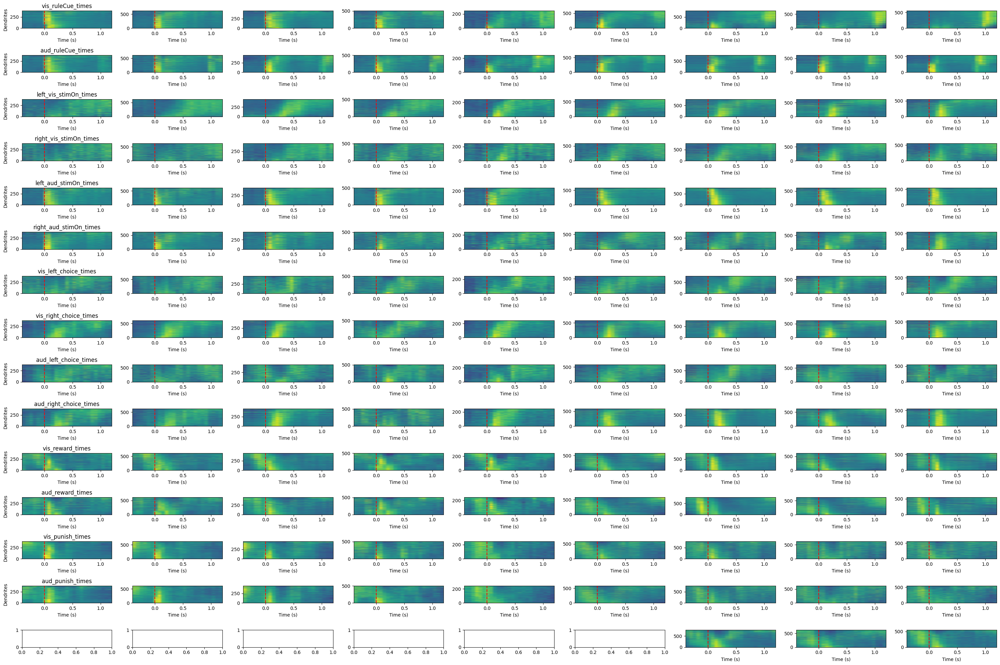

In [7]:
fig, axes = plt.subplots(len(event_preds), len(dates), figsize = (30,20))
timepoints = np.linspace(psth_time_start*1000, psth_time_end*1000, 66)
for datei, date in enumerate(dates):
    for predi, pred in enumerate(event_preds):
        try:
            psth_key = pred + '_psth'
            psths = np.array([])
            if 'arm1' in mouse_data[date]:
                for neuron in mouse_data[date]['arm1']:
                    if neuron['celltype'] == 'soma':
                        continue
                    if psths.size == 0:
                        psths = neuron[psth_key][np.newaxis,:]
                    else:
                        psths = np.vstack([neuron[psth_key], psths])
            if 'arm2' in mouse_data[date]:
                for neuron in mouse_data[date]['arm2']:
                    if neuron['celltype'] == 'soma':
                        continue
                    if psths.size == 0:
                        psths = neuron[psth_key][np.newaxis,:]
                    else:
                        psths = np.vstack([neuron[psth_key], psths])
            # max_abs_indices = np.argmax(np.abs(psths), axis=1)
            # sort_order = np.argsort(max_abs_indices)
            sort_order,_ = sort_psth_by_average_response(psths[:,:13],0.4,frame_rate_arm1)
            onset_ordered_psth = psths[sort_order[::-1]]
            #timepoints = np.linspace(psth_time_start*1000, psth_time_end*1000, psths.shape[1])

            # Plot with consistent axis dimensions
            im = axes[predi, datei].imshow(onset_ordered_psth, aspect='auto',extent=[psth_time_start, psth_time_end, 0, psths.shape[0]], vmin=-3, vmax=3)
            axes[predi, datei].axvline(x=0, color='red', linestyle='--')
            if datei == 0:
                axes[predi, datei].set_title(f"{pred}")
                axes[predi, datei].set_ylabel('Dendrites')
            axes[predi, datei].set_xlabel('Time (s)')
        except:
            continue

        
        #axes[predi, datei].set_xticks([])
        #axes[predi, datei].set_yticks([])

fig.tight_layout()
fig.savefig(os.path.join(mouse_path, 'figures',  'all_psths.png'),
                dpi=300,               # High resolution for publication
                bbox_inches='tight',   # Prevent clipping
                )

In [7]:
event_preds

['vis_ruleCue_times',
 'aud_ruleCue_times',
 'left_vis_stimOn_times',
 'right_vis_stimOn_times',
 'left_aud_stimOn_times',
 'right_aud_stimOn_times',
 'vis_reward_times',
 'aud_reward_times',
 'vis_punish_times',
 'aud_punish_times']

In [ ]:
fig, axes = plt.subplots(len(event_preds), len(dates), figsize = (15,20))
timepoints = np.linspace(psth_time_start*1000, psth_time_end*1000, 66)
for datei, date in enumerate(dates):
    for predi, pred in enumerate(event_preds):
        if 'vis_stimOn_times' not in pred:
            continue
        psth_key = pred + '_psth'
        psths = np.array([])
        if 'arm1' in mouse_data[date]:
            for neuron in mouse_data[date]['arm1']:
                if neuron['celltype'] == 'soma':
                    continue
                if psths.size == 0:
                    psths = neuron[psth_key][np.newaxis,:]
                else:
                    psths = np.vstack([neuron[psth_key], psths])
        if 'arm2' in mouse_data[date]:
            for neuron in mouse_data[date]['arm2']:
                if neuron['celltype'] == 'soma':
                    continue
                if psths.size == 0:
                    psths = neuron[psth_key][np.newaxis,:]
                else:
                    psths = np.vstack([neuron[psth_key], psths])
        max_abs_indices = np.argmax(np.abs(psths), axis=1)
        sort_order = np.argsort(max_abs_indices)
        onset_ordered_psth = psths[sort_order]
        #timepoints = np.linspace(psth_time_start*1000, psth_time_end*1000, psths.shape[1])

        # Plot with consistent axis dimensions
        im = axes[predi, datei].imshow(onset_ordered_psth, aspect='auto',extent=[psth_time_start, psth_time_end, 0, psths.shape[0]], vmin=-3, vmax=3)
        axes[predi, datei].axvline(x=0, color='red', linestyle='--')
        if datei == 0:
            axes[predi, datei].set_title(f"{pred}")
            axes[predi, datei].set_ylabel('Dendrites')
        axes[predi, datei].set_xlabel('Time (s)')

        
        #axes[predi, datei].set_xticks([])
        #axes[predi, datei].set_yticks([])

fig.tight_layout()

In [11]:
all_vis_reward_psths = []
all_aud_reward_psths = []
all_omission_psths = []
for datei, date in enumerate(dates):
    vis_reward_psth_key = 'vis_reward_times' + '_psth'
    aud_reward_psth_key = 'aud_reward_times' + '_psth'
    omission_psth_key = 'omission_times' + '_psth'
    vis_reward_psths = np.array([])
    aud_reward_psths = np.array([])
    omission_psths = np.array([])
    if 'arm1' in mouse_data[date]:
        for neuron in mouse_data[date]['arm1']:
            if neuron['celltype'] == 'soma':
                continue
            if vis_reward_psths.size == 0:
                vis_reward_psths = neuron[vis_reward_psth_key][np.newaxis,:]
            else:
                vis_reward_psths = np.vstack([neuron[vis_reward_psth_key], vis_reward_psths])
            if aud_reward_psths.size == 0:
                aud_reward_psths = neuron[aud_reward_psth_key][np.newaxis,:]
            else:
                aud_reward_psths = np.vstack([neuron[aud_reward_psth_key], aud_reward_psths])
            if omission_psth_key in neuron:
                if omission_psths.size == 0:
                    omission_psths = neuron[omission_psth_key][np.newaxis,:]
                else:
                    omission_psths = np.vstack([neuron[omission_psth_key], omission_psths])
    if 'arm2' in mouse_data[date]:
        for neuron in mouse_data[date]['arm2']:
            if neuron['celltype'] == 'soma':
                continue
            if vis_reward_psths.size == 0:
                vis_reward_psths = neuron[vis_reward_psth_key][np.newaxis,:]
            else:
                vis_reward_psths = np.vstack([neuron[vis_reward_psth_key], vis_reward_psths])
            if aud_reward_psths.size == 0:
                aud_reward_psths = neuron[aud_reward_psth_key][np.newaxis,:]
            else:
                aud_reward_psths = np.vstack([neuron[aud_reward_psth_key], aud_reward_psths])
            if omission_psth_key in neuron:
                if omission_psths.size == 0:
                    omission_psths = neuron[omission_psth_key][np.newaxis,:]
                else:
                    omission_psths = np.vstack([neuron[omission_psth_key], omission_psths])
    all_vis_reward_psths.append(vis_reward_psths)
    all_aud_reward_psths.append(aud_reward_psths)
    all_omission_psths.append(omission_psths)


In [40]:
vis_reward_psth = all_vis_reward_psths[-1]
timepoints = np.linspace(psth_time_start*1000, psth_time_end*1000, vis_reward_psth.shape[1])
post_win = np.where((timepoints > 0) & (timepoints <= 500))[0]
vis_reward_resp_idx = np.where(np.mean(vis_reward_psth[:,post_win],axis=1)>1)[0]
len(vis_reward_resp_idx)

108

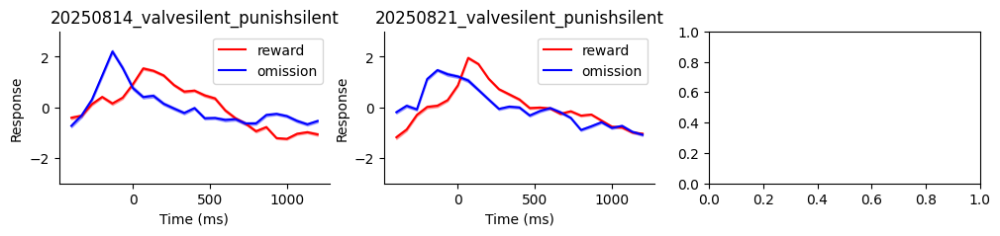

In [13]:
timepoints = np.linspace(psth_time_start*1000, psth_time_end*1000, all_vis_reward_psths[0].shape[1])
post_win = np.where((timepoints >= 0) & (timepoints <= 200))[0]
fig, axes = plt.subplots(1, 3, figsize = (12,2))
colors = sns.color_palette('hsv', len(all_vis_reward_psths))
dates2plot = dates[-2:]
reward_psth2plot = all_vis_reward_psths[-2:]
omission_psth2plot = all_omission_psths[-2:]
for i, (reward_psth, omission_psth) in enumerate(zip(reward_psth2plot, omission_psth2plot)):
    axes[i].set_title(dates2plot[i])
    reward_resp_idx = np.where(np.mean(reward_psth[:,post_win],axis=1)>1)[0]
    plot_with_error_shading(reward_psth[reward_resp_idx], time_points=timepoints, label='reward',
                            ax = axes[i], 
                            color = 'red',ymin=-3, ymax=3)
    plot_with_error_shading(omission_psth[reward_resp_idx], time_points=timepoints, label='omission',
                            ax = axes[i], 
                            color = 'blue',ymin=-3, ymax=3)
    

In [66]:
omission_psth.shape

(25,)

C:\Users\dirk\AppData\Local\Temp\ipykernel_35024\3484311540.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


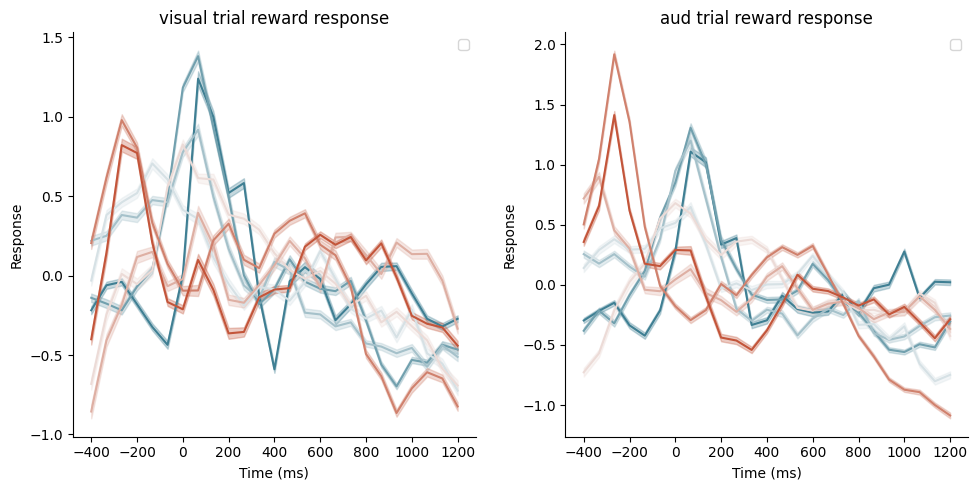

In [21]:

timepoints = np.linspace(psth_time_start*1000, psth_time_end*1000, all_vis_reward_psths[0].shape[1])
post_win = np.where((timepoints >= 0) & (timepoints <= 500))[0]
fig, axes = plt.subplots(1, 2, figsize = (10,5))
colors = sns.diverging_palette(220, 20,  n = len(all_vis_reward_psths))
for i, (vis_reward_psth, aud_reward_psth) in enumerate(zip(all_vis_reward_psths, all_aud_reward_psths)):
    if vis_reward_psth.size == 0:
        continue
    vis_reward_resp_idx = np.where(np.mean(vis_reward_psth[:,post_win],axis=1)>1)[0]
    plot_with_error_shading(vis_reward_psth[:], time_points=timepoints,
                            ax = axes[0], title = 'visual trial reward response', 
                            #label=dates[i],
                            color = colors[i])
    aud_reward_resp_idx = np.where(np.mean(aud_reward_psth[:,post_win],axis=1)>1)[0]
    plot_with_error_shading(aud_reward_psth[:], time_points=timepoints,
                            ax = axes[1], title = 'aud trial reward response',
                            color = colors[i])
fig.tight_layout()
#axes[0].legend(loc="upper right")

In [91]:
all_aud_reward_psths[0].shape

(387, 25)

Plot Cluster Topography

In [ ]:
fig, axes = plt.subplots(3,3,figsize = (30,15))
fig.suptitle(mouse_id + ' cluster topography', fontsize=16)
for dayi, date in enumerate(dates):
    
    axes[dayi//3, dayi%3].imshow(atlas_template,cmap='gray')
    axes[dayi//3, dayi%3].set_title(date)
    axes[dayi//3, dayi%3].set_xticks([])
    axes[dayi//3, dayi%3].set_yticks([])
    neuron_date_idx = np.where(neuron_data['date'] == date)[0]
    cluster_labels_in_date = cluster_labels[neuron_date_idx]
    arm1_idx = np.where(neuron_data['arm'][neuron_date_idx] == 'arm1')[0]
    arm2_idx = np.where(neuron_data['arm'][neuron_date_idx] == 'arm2')[0]
    
    
    if 'arm1' in mouse_data[date]:
        arm1_cluster_labels = cluster_labels_in_date[arm1_idx]
        stat = mouse_data[date]['arm1']
        aspect_ratio = np.array([stat[i]['aspect_ratio'] for i in range(len(stat))])
        npix = np.array([stat[i]['npix'] for i in range(len(stat))])
        pc_idx = np.where((aspect_ratio<1.1) & (npix<120) & (npix>100))[0]
        dd_idx = np.where((aspect_ratio>1.1) | (npix>120) | (npix<100))[0]
        for i, neuron in enumerate(mouse_data[date]['arm1'][dd_idx]):
            color = colors[arm1_cluster_labels[i]]
            axes[dayi//3, dayi%3].scatter(neuron['xcoord_atlas'], neuron['ycoord_atlas'], c=color, s=0.001)
    if 'arm2' in mouse_data[date]:
        arm2_cluster_labels = cluster_labels_in_date[arm2_idx]
        stat = mouse_data[date]['arm2']
        aspect_ratio = np.array([stat[i]['aspect_ratio'] for i in range(len(stat))])
        npix = np.array([stat[i]['npix'] for i in range(len(stat))])
        pc_idx = np.where((aspect_ratio<1.1) & (npix<120) & (npix>100))[0]
        dd_idx = np.where((aspect_ratio>1.1) | (npix>120) | (npix<100))[0]
        for i, neuron in enumerate(mouse_data[date]['arm2'][dd_idx]):
            color = colors[arm2_cluster_labels[i]]
            axes[dayi//3, dayi%3].scatter(neuron['xcoord_atlas'], neuron['ycoord_atlas'], c=color, s=0.001)
fig.tight_layout()
fig.savefig(os.path.join(mouse_path, 'figures', 'cluster_topo.png'),
            dpi=300,               # High resolution for publication
            bbox_inches='tight',   # Prevent clipping
            )

Plot Unique Explained Variance Topography

In [46]:
unique_predictors

['vis_ruleCue_times',
 'aud_ruleCue_times',
 'left_vis_stimOn_times',
 'right_vis_stimOn_times',
 'left_aud_stimOn_times',
 'right_aud_stimOn_times',
 'vis_reward_times',
 'aud_reward_times',
 'vis_punish_times',
 'aud_punish_times',
 'omission_times',
 'leftchoice',
 'rightchoice',
 'previous_feedbackType',
 'reward_history',
 'body',
 'lick',
 'face',
 'pupil_area',
 'pupil_xpos',
 'pupil_ypos']

In [5]:
unique_predictors

['nose',
 'jaw',
 'lick',
 'face',
 'eye',
 'ear',
 'whisker',
 'shoulder',
 'limb',
 'pupil_area',
 'pupil_xpos',
 'pupil_ypos',
 'vel']

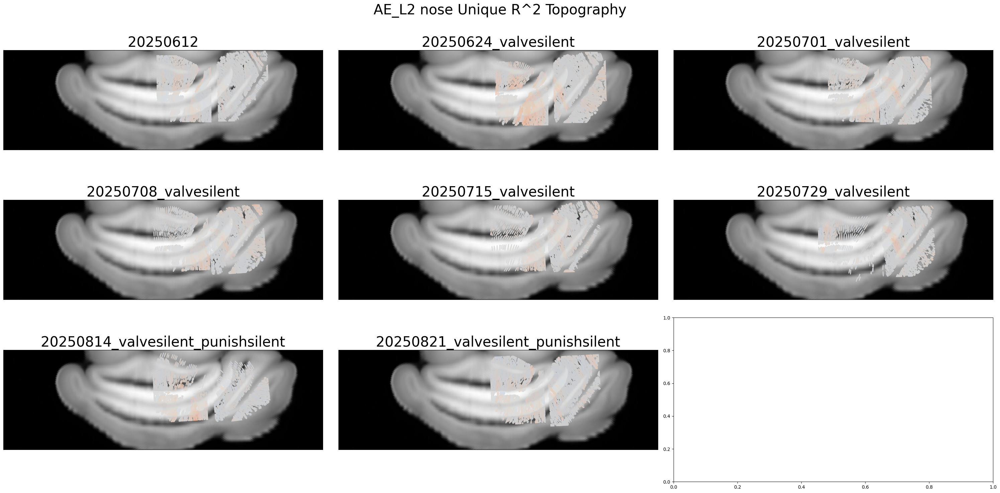

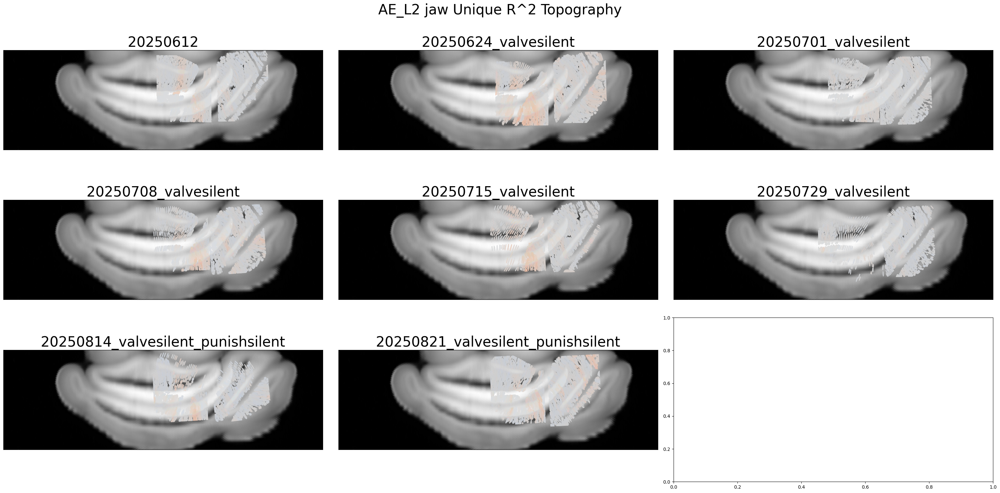

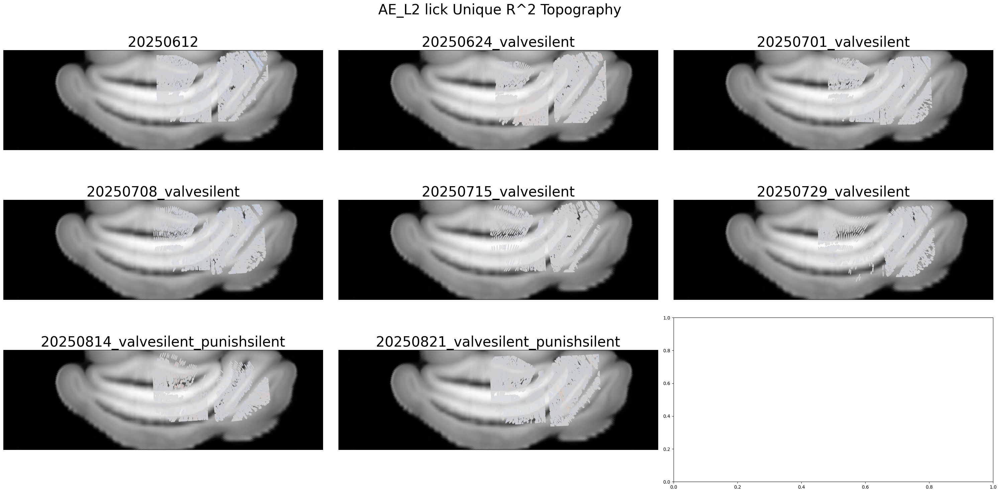

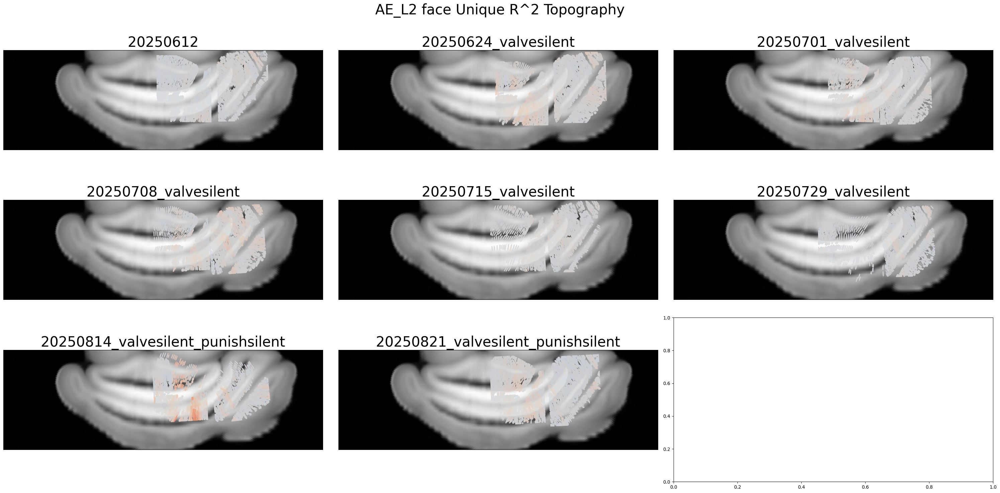

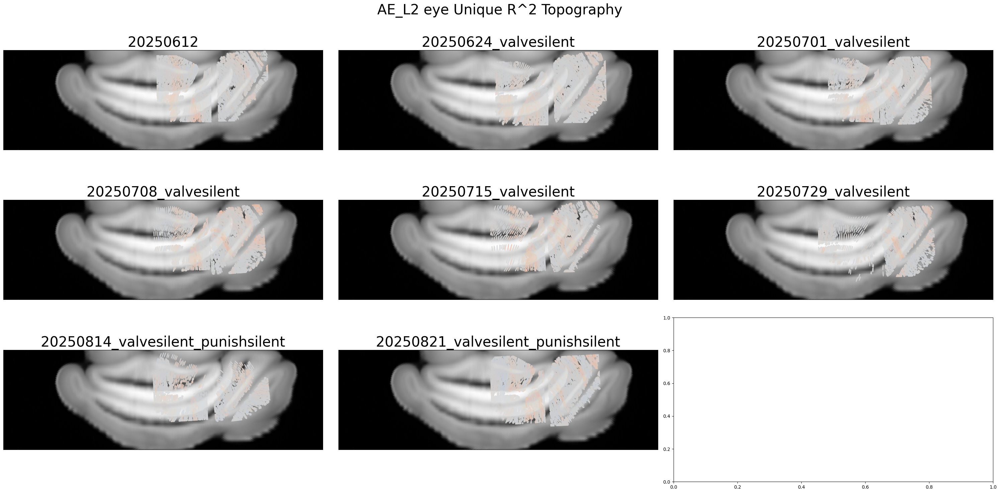

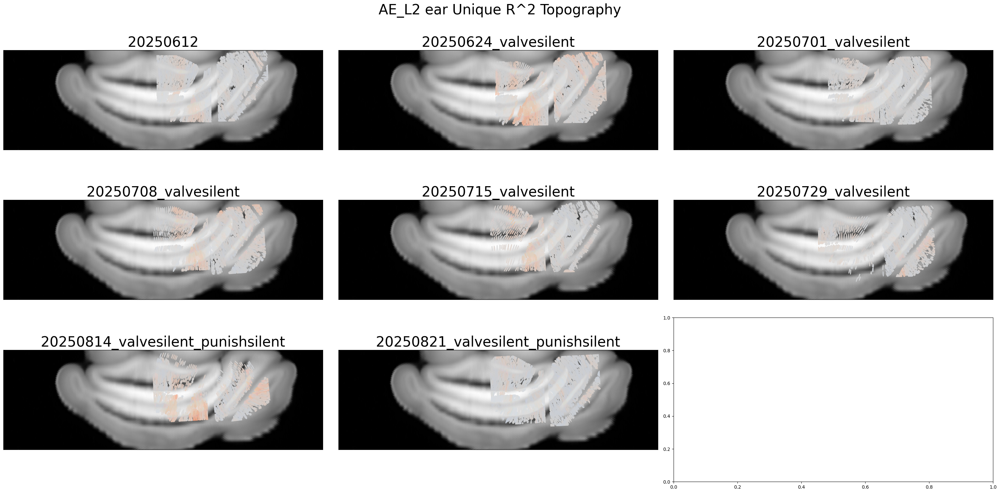

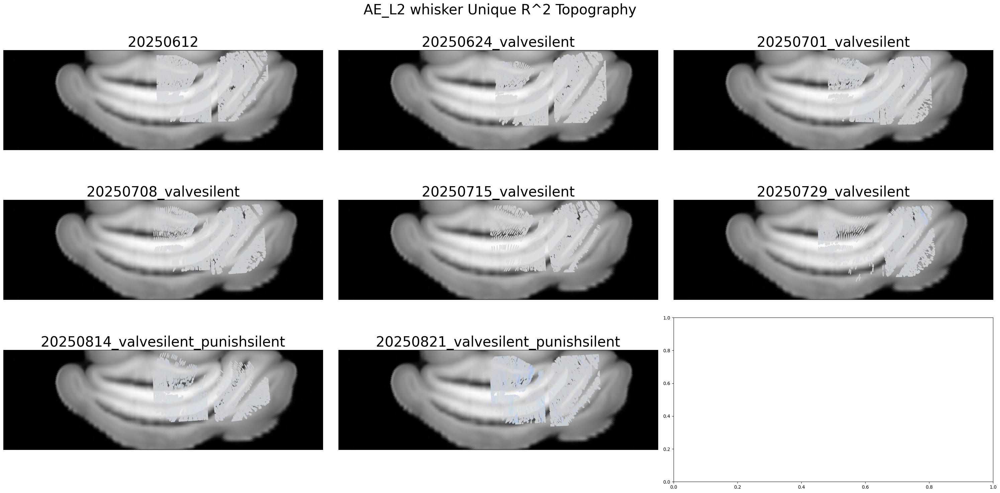

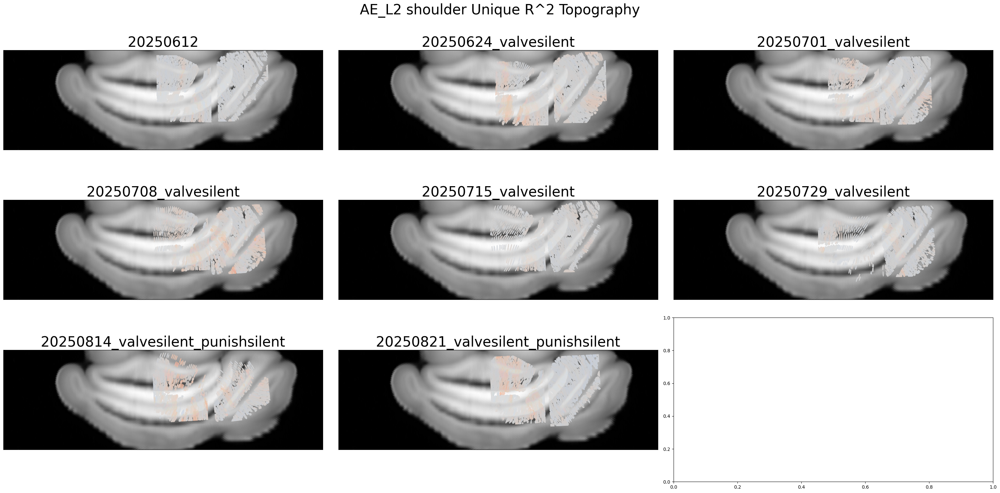

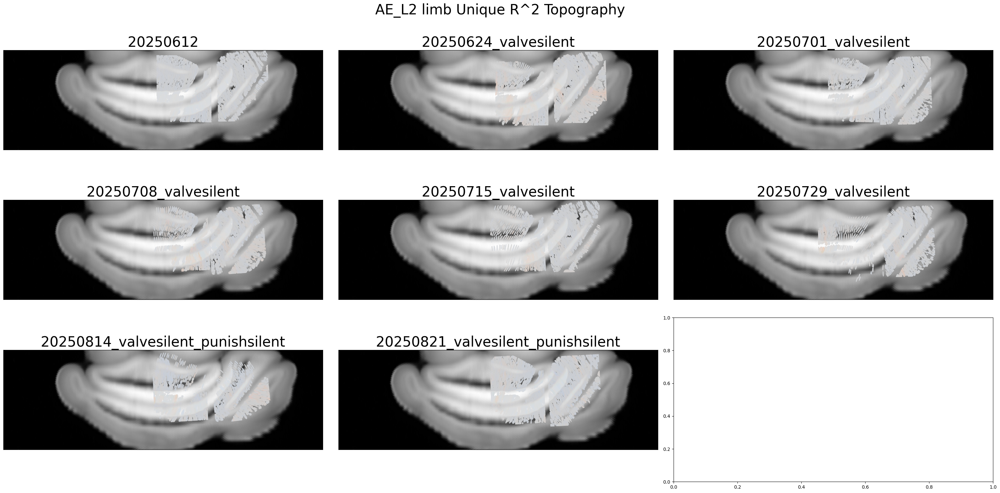

In [4]:
os.makedirs(os.path.join(mouse_path, 'figures', 'facial_region_roi_unique_explained_variance'), exist_ok=True)
rows, cols = grid_shape(len(dates)) # change this
for pred in unique_predictors:
    fig, axes = plt.subplots(rows, cols, figsize=(30, 15))
    fig.suptitle(mouse_id + ' '+pred+' Unique R^2 Topography', fontsize=30)
    unique_pred_idx = unique_predictors.index(pred)

    for dayi, date in enumerate(dates):
        ax = axes[dayi // cols, dayi % cols]
        
        # Background atlas
        ax.imshow(atlas_template, cmap='gray')
        ax.set_title(date, fontsize=30)
        ax.set_xticks([])
        ax.set_yticks([])

        # Plot arm1 neurons
        if 'arm1' in mouse_data[date]:
            stat = mouse_data[date]['arm1']
            for i, neuron in enumerate(np.array(stat)):
                if neuron['celltype'] == 'soma':
                    continue
                r2 = neuron['unique_explained_variance'][unique_pred_idx]
                # p_value = neuron['bootstrap_p_value'][unique_pred_idx]
                # color = 'gray' if p_value > 0.05 else r2  # Gray for non-significant, R² for significant
                color = r2
                ax.scatter(
                    neuron['xcoord_atlas'], 
                    neuron['ycoord_atlas'], 
                    c=color if color == 'gray' else np.repeat(r2, len(neuron['xcoord_atlas'])), 
                    cmap='coolwarm', 
                    vmin=-0.02, vmax=0.02, 
                    s=0.001
                )

        # Plot arm2 neurons
        # Plot arm2 neurons
        if 'arm2' in mouse_data[date]:
            stat = mouse_data[date]['arm2']
            for i, neuron in enumerate(np.array(stat)):
                if neuron['celltype'] == 'soma':
                    continue
                r2 = neuron['unique_explained_variance'][unique_pred_idx]
                # p_value = neuron['bootstrap_p_value'][unique_pred_idx]
                # color = 'gray' if p_value > 0.05 else r2  # Gray for non-significant, R² for significant
                color = r2
                ax.scatter(
                    neuron['xcoord_atlas'], 
                    neuron['ycoord_atlas'], 
                    c=color if color == 'gray' else np.repeat(r2, len(neuron['xcoord_atlas'])), 
                    cmap='coolwarm', 
                    vmin=-0.02, vmax=0.02, 
                    s=0.001
                )

    fig.tight_layout()
    plt.show()

    fig.savefig(os.path.join(mouse_path, 'figures', 'facial_region_roi_unique_explained_variance', 'unique_r_'+ pred + '_topo.png'),
                dpi=300,               # High resolution for publication
                bbox_inches='tight',   # Prevent clipping
                )
    plt.close(fig)

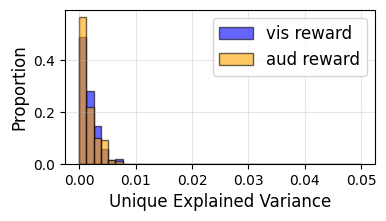

In [12]:


vis_reward_pred_idx = unique_predictors.index('vis_reward_times')
aud_reward_pred_idx = unique_predictors.index('aud_reward_times')
vis_reward_unique_var = []
vis_reward_pval = []
aud_reward_unique_var = []
aud_reward_pval = []
date = dates[0]
    

# Plot arm1 neurons
if 'arm1' in mouse_data[date]:
    stat = mouse_data[date]['arm1']
    for i, neuron in enumerate(np.array(stat)):
        if neuron['celltype'] == 'soma':
            continue
        vis_reward_unique_var.append(neuron['unique_explained_variance'][vis_reward_pred_idx])
        vis_reward_pval.append(neuron['bootstrap_p_value'][vis_reward_pred_idx])
        aud_reward_unique_var.append(neuron['unique_explained_variance'][aud_reward_pred_idx])
        aud_reward_pval.append(neuron['bootstrap_p_value'][aud_reward_pred_idx])

# Plot arm2 neurons
# Plot arm2 neurons
if 'arm2' in mouse_data[date]:
    stat = mouse_data[date]['arm2']
    for i, neuron in enumerate(np.array(stat)):
        if neuron['celltype'] == 'soma':
            continue
        vis_reward_unique_var.append(neuron['unique_explained_variance'][vis_reward_pred_idx])
        vis_reward_pval.append(neuron['bootstrap_p_value'][vis_reward_pred_idx])
        aud_reward_unique_var.append(neuron['unique_explained_variance'][aud_reward_pred_idx])
        aud_reward_pval.append(neuron['bootstrap_p_value'][aud_reward_pred_idx])
vis_reward_unique_var = np.array(vis_reward_unique_var)
vis_reward_pval = np.array(vis_reward_pval)
aud_reward_unique_var = np.array(aud_reward_unique_var)
aud_reward_pval = np.array(aud_reward_pval)
bins = np.linspace(0.0, 0.05, 40)
vis_reward_data = vis_reward_unique_var[vis_reward_pval<0.05]
aud_reward_data = aud_reward_unique_var[aud_reward_pval<0.05]
vis_counts, _ = np.histogram(vis_reward_data, bins=bins)
vis_proportions = vis_counts / len(vis_reward_data)

# Compute the histogram for aud_reward_data and normalize to proportions
aud_counts, _ = np.histogram(aud_reward_data, bins=bins)
aud_proportions = aud_counts / len(aud_reward_data)

# Plot the histograms as proportions
plt.figure(figsize=(4, 2))
plt.bar(bins[:-1], vis_proportions, width=np.diff(bins), align='edge', alpha=0.6, label='vis reward', color='blue', edgecolor='black')
plt.bar(bins[:-1], aud_proportions, width=np.diff(bins), align='edge', alpha=0.6, label='aud reward', color='orange', edgecolor='black')

# Add labels, legend, and title
plt.xlabel('Unique Explained Variance', fontsize=12)
plt.ylabel('Proportion', fontsize=12)
#plt.title('Unique Explained Variance of Reward', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()
            

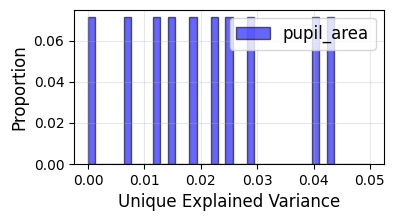

In [15]:
predictor_name = 'pupil_area'
predictor_pred_idx = unique_predictors.index(predictor_name)
cell_type = 'soma'
predictor_unique_var = []
predictor_pval = []
date = dates[2]
    

# Plot arm1 neurons
if 'arm1' in mouse_data[date]:
    stat = mouse_data[date]['arm1']
    for i, neuron in enumerate(np.array(stat)):
        if neuron['celltype'] != cell_type:
            continue
        predictor_unique_var.append(neuron['unique_explained_variance'][predictor_pred_idx])
        predictor_pval.append(neuron['bootstrap_p_value'][predictor_pred_idx])

# Plot arm2 neurons
if 'arm2' in mouse_data[date]:
    stat = mouse_data[date]['arm2']
    for i, neuron in enumerate(np.array(stat)):
        if neuron['celltype'] != cell_type:
            continue
        predictor_unique_var.append(neuron['unique_explained_variance'][predictor_pred_idx])
        predictor_pval.append(neuron['bootstrap_p_value'][predictor_pred_idx])
predictor_unique_var = np.array(predictor_unique_var)
predictor_pval = np.array(predictor_pval)

bins = np.linspace(0.0, 0.05, 40)
predictor_data = predictor_unique_var[predictor_pval<0.05]
predictor_counts, _ = np.histogram(predictor_data, bins=bins)
predictor_proportions = predictor_counts / len(predictor_data)

# Plot the histograms as proportions
plt.figure(figsize=(4, 2))
plt.bar(bins[:-1], predictor_proportions, width=np.diff(bins), align='edge', alpha=0.6, label=predictor_name, color='blue', edgecolor='black')

# Add labels, legend, and title
plt.xlabel('Unique Explained Variance', fontsize=12)
plt.ylabel('Proportion', fontsize=12)
#plt.title('Unique Explained Variance of Reward', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

In [ ]:
mouse_data['20240910']['arm1'][0]['unique_explained_variance']

(21,)

In [6]:


vis_reward_psth_by_day = []
aud_reward_psth_by_day = []
vis_reward_beta_by_day = []
aud_reward_beta_by_day = []
for dayi, date in enumerate(dates):
    vis_reward_beta_by_day.append([])
    aud_reward_beta_by_day.append([])
    vis_reward_psth_by_day.append([])
    aud_reward_psth_by_day.append([])
    if 'arm1' in mouse_data[date]:
        for neuron in mouse_data[date]['arm1']:
            vis_reward_beta_by_day[dayi].append(neuron['vis_reward_times_beta'])
            aud_reward_beta_by_day[dayi].append(neuron['aud_reward_times_beta'])
            vis_reward_psth_by_day[dayi].append(neuron['vis_reward_times_psth'])
            aud_reward_psth_by_day[dayi].append(neuron['aud_reward_times_psth'])
    if 'arm2' in mouse_data[date]:
        for neuron in mouse_data[date]['arm2']:
            vis_reward_beta_by_day[dayi].append(neuron['vis_reward_times_beta'])
            aud_reward_beta_by_day[dayi].append(neuron['aud_reward_times_beta'])
            vis_reward_psth_by_day[dayi].append(neuron['vis_reward_times_psth'])
            aud_reward_psth_by_day[dayi].append(neuron['aud_reward_times_psth'])
    
    vis_reward_beta_by_day[dayi] = np.array(vis_reward_beta_by_day[dayi])
    aud_reward_beta_by_day[dayi] = np.array(aud_reward_beta_by_day[dayi])
    vis_reward_psth_by_day[dayi] = np.array(vis_reward_psth_by_day[dayi])
    aud_reward_psth_by_day[dayi] = np.array(aud_reward_psth_by_day[dayi])
    







In [7]:
beta_timepoint = np.linspace(0,1000,vis_reward_beta_by_day[0].shape[1])
psth_timepoint = np.linspace(psth_time_start*1000,psth_time_end*1000,vis_reward_psth_by_day[0].shape[1])



In [85]:
tf_arm1_table_for_img

,intervals_0,intervals_1,ruleCue_times,ruleCueTrigger_times,response_times,choice,stimOnTrigger_times,stimOn_times,contrastLeft,contrastRight,...,vis_punish_times,aud_punish_times,vis_ruleCue_times,aud_ruleCue_times,left_vis_stimOn_times,right_vis_stimOn_times,left_aud_stimOn_times,right_aud_stimOn_times,previous_feedbackType,reward_history
0,172,314,250,249,290,1,262,265,1.0,NaN,...,NaN,NaN,250.0,NaN,265.0,NaN,NaN,NaN,0,0.45
1,335,387,344,344,364,1,356,357,0.5,NaN,...,NaN,NaN,344.0,NaN,357.0,NaN,NaN,NaN,1,0.45
2,407,525,414,413,471,1,425,426,NaN,1.0,...,472.0,NaN,414.0,NaN,NaN,426.0,NaN,NaN,1,0.45
3,544,642,554,554,587,-1,566,567,1.0,NaN,...,588.0,NaN,554.0,NaN,567.0,NaN,NaN,NaN,-1,0.45
4,660,712,668,667,689,-1,679,680,NaN,1.0,...,NaN,NaN,668.0,NaN,NaN,680.0,NaN,NaN,-1,0.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,43244,43314,43254,43254,43291,-1,43286,43287,NaN,0.0,...,NaN,NaN,NaN,43254.0,NaN,NaN,NaN,43286.0,1,0.70
356,43334,43414,43344,43344,43360,1,43356,43357,NaN,0.0,...,NaN,43361.0,NaN,43344.0,NaN,NaN,NaN,43357.0,1,0.70
357,43433,43570,43440,43440,43546,1,43475,43476,0.0,NaN,...,NaN,NaN,NaN,43440.0,NaN,NaN,43475.0,NaN,-1,0.75
358,43590,43647,43599,43599,43623,1,43611,43612,0.0,NaN,...,NaN,NaN,NaN,43599.0,NaN,NaN,43611.0,NaN,1,0.75


In [72]:
lick_rate, _,_ = calculate_lick_rate(lick_times_behavior, video_frame_rate, bin_size_s=0.066, total_duration_s=None, total_frames=None)

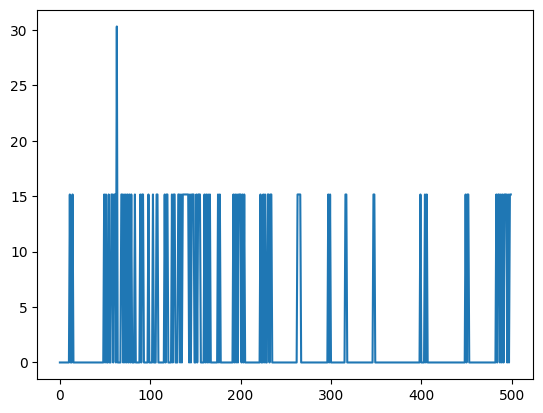

In [74]:
plt.plot(lick_rate[:500])

In [47]:
lick_timepoint = np.linspace(video_trial_start*1000, video_trial_end*1000, int((video_trial_end-video_trial_start)*frame_rate_arm1)+1)

In [11]:
reward_lick_by_day = []
for dayi, date in enumerate(dates):
    reward_lick_by_day.append([])
    bhv_path = os.path.join(mouse_path,date,'behavior')
    facemap_folder = os.path.join(mouse_path,date,'behavior','raw_video_data')
    table_for_video = pd.read_csv(bhv_path+'\\table_for_video.csv')
    video_path = os.path.join(facemap_folder,'_iblrig_leftCamera.raw.avi')
    video_meta = get_video_meta(video_path, one=None)
    video_frame_rate = video_meta['fps']
    if 'reward_consume_times' in table_for_video.columns:
        reward_video_idx = find_frame_indices(table_for_video, video_frame_rate, (-2,2), 'reward_consume_times').astype(int)
        
        reward_video_idx = reward_video_idx[table_for_video.loc[table_for_video['feedbackType']==1]['modality'] == 0]
    else:
        feedback_video_idx = find_frame_indices(table_for_video, video_frame_rate, (-2,2), 'feedback_times')
        reward_video_idx = feedback_video_idx[(table_for_video['feedbackType'] == 1) & (table_for_video['modality'] == 0)].astype(int)
    lick = np.squeeze(mouse_data[date]['lick'][:,0])
    for i in range(len(reward_video_idx)):
        trial_lick = lick[reward_video_idx[i]]
        #trial_lick = zscore(downsample_array(trial_lick,len(psth_timepoint),axis=0, method = 'interpolate'))
        reward_lick_by_day[dayi].append(trial_lick)
    reward_lick_by_day[dayi] = np.array(reward_lick_by_day[dayi])
    
    

In [16]:
lick_timepoint = np.linspace(-2*1000, 2*1000, reward_lick_by_day[0].shape[1])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


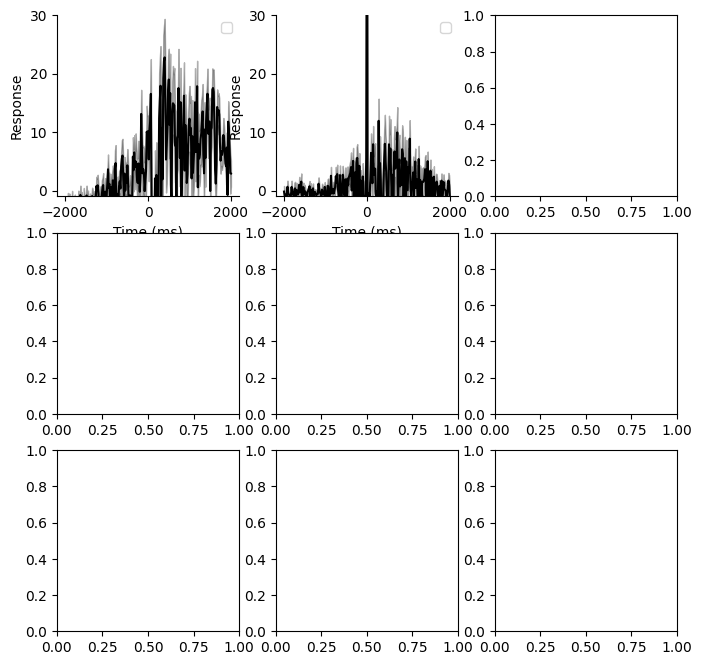

In [20]:
fig, axes = plt.subplots(3,3,figsize = (8,8))
#fig.suptitle(mouse_id + ' cluster topography', fontsize=16)
for i in range(len(vis_reward_beta_by_day)):
    row = i//3
    column = i%3
    ax = axes[row,column]
    plot_with_error_shading(data = reward_lick_by_day[i], time_points = lick_timepoint, ymax=30, ymin=-1, ax=ax, color='k')
    #ax.set_xlim(-400,1200)

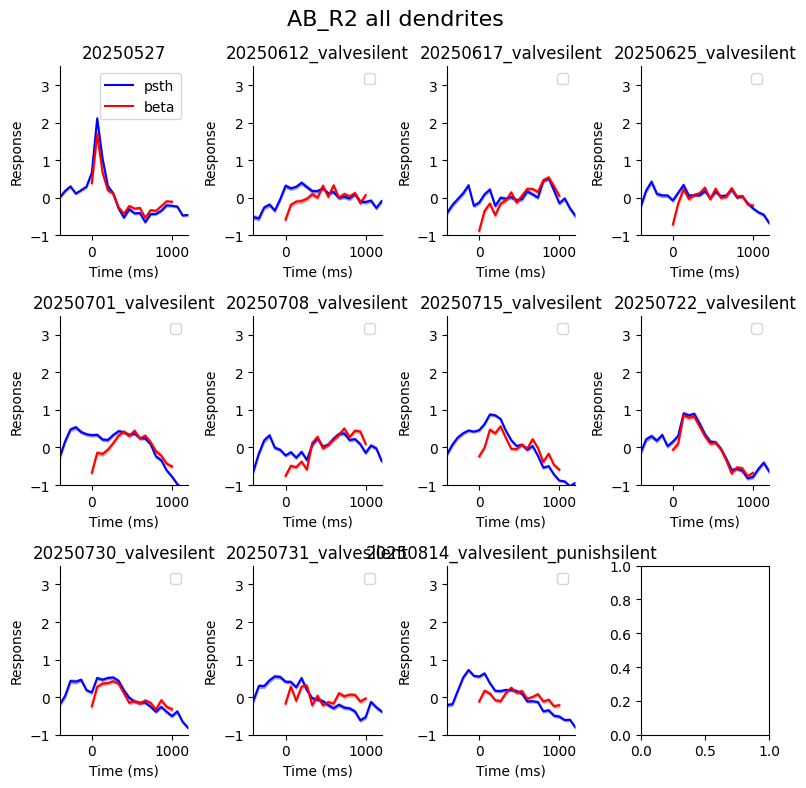

In [30]:
rows, cols = grid_shape(len(dates))
fig, axes = plt.subplots(rows,cols,figsize = (8,8))
#fig.suptitle(mouse_id + ' cluster topography', fontsize=16)
for i in range(len(vis_reward_beta_by_day)):
    row = i//cols
    column = i%cols
    ax = axes[row,column]
    plot_with_error_shading(data = vis_reward_psth_by_day[i], time_points = psth_timepoint,ymax=3.5, ymin=-1, ax=ax, color='b')
    plot_with_error_shading(data = vis_reward_beta_by_day[i], time_points = beta_timepoint,ymax=3.5, ymin=-1, ax=ax, color='r')
    
    ax.set_title(dates[i])
    ax.set_xlim(-400, 1200)


axes[0,0].legend(['psth','beta'])
fig.suptitle(mouse_id + ' all dendrites', fontsize=16)
plt.tight_layout()
fig.savefig(os.path.join(mouse_path, 'figures', 'all_dendrites_psth_vs_beta.png'),
            dpi=300,               # High resolution for publication
            bbox_inches='tight',   # Prevent clipping
            )

c:\Users\dirk\Documents\ibl_analysis\ibllib\murphlib\plotting.py:75: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


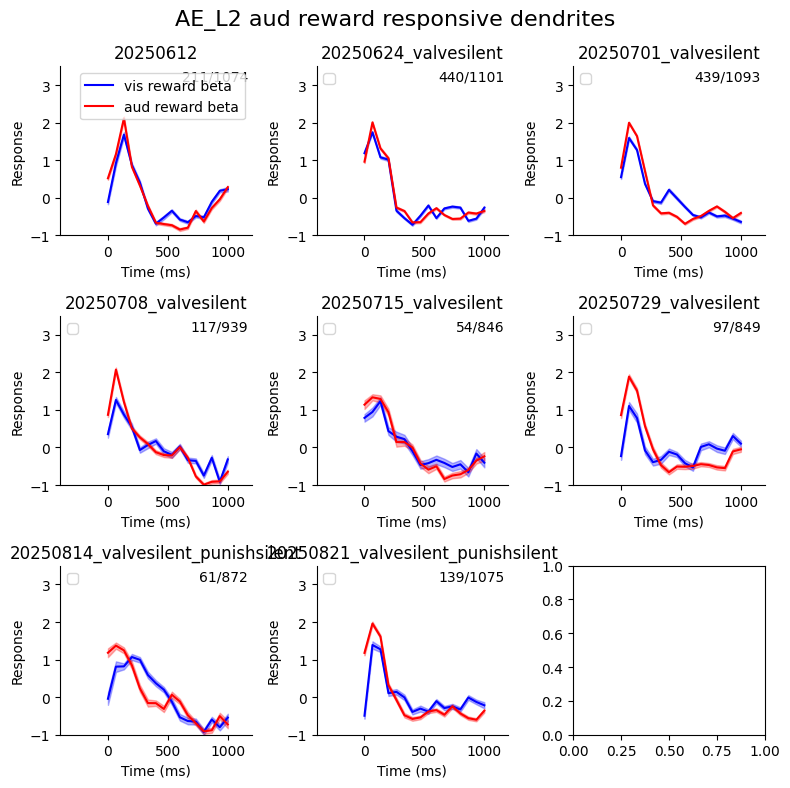

In [9]:
post_win = np.where((beta_timepoint >= 0) & (beta_timepoint <= 200))[0]

rows, cols = grid_shape(len(dates))
fig, axes = plt.subplots(rows,cols,figsize = (8,8))
#fig.suptitle(mouse_id + ' cluster topography', fontsize=16)
for i in range(len(vis_reward_beta_by_day)):
    row = i//cols
    column = i%cols
    ax = axes[row,column]

    vis_reward_resp_idx = np.where(np.mean(vis_reward_beta_by_day[i][:,post_win],axis=1)>1)[0]
    aud_reward_resp_idx = np.where(np.mean(aud_reward_beta_by_day[i][:,post_win],axis=1)>1)[0]
    plot_with_error_shading(data = vis_reward_beta_by_day[i][aud_reward_resp_idx], time_points = beta_timepoint,ymax=3.5, ymin=-1, ax=ax, color='b')
    plot_with_error_shading(data = aud_reward_beta_by_day[i][aud_reward_resp_idx], time_points = beta_timepoint,ymax=3.5, ymin=-1, ax=ax, color='r')
    
    ax.set_title(dates[i])
    ax.set_xlim(-400, 1200)
    ax.text(0.98, 0.98, str(len(aud_reward_resp_idx))+'/'+str(len(vis_reward_beta_by_day[i])), transform=ax.transAxes, 
        fontsize=10, ha='right', va='top')
fig.suptitle(mouse_id + ' aud reward responsive dendrites', fontsize=16)
plt.tight_layout()
axes[0,0].legend(['vis reward beta','aud reward beta'])
fig.savefig(os.path.join(mouse_path, 'figures', 'aud_reward_responsive_dendrites_vis_reward_vs_aud_reward.png'),
            dpi=300,               # High resolution for publication
            bbox_inches='tight',   # Prevent clipping
            )

In [31]:
len(psth_timepoint)

25

In [33]:
reward_lick_by_day[1].shape

(183, 25)

c:\Users\dirk\anaconda3\envs\iblenv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\dirk\anaconda3\envs\iblenv\lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
c:\Users\dirk\anaconda3\envs\iblenv\lib\site-packages\numpy\core\_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\dirk\anaconda3\envs\iblenv\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\dirk\anaconda3\envs\iblenv\lib\site-packages\numpy\core\_methods.py:258: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


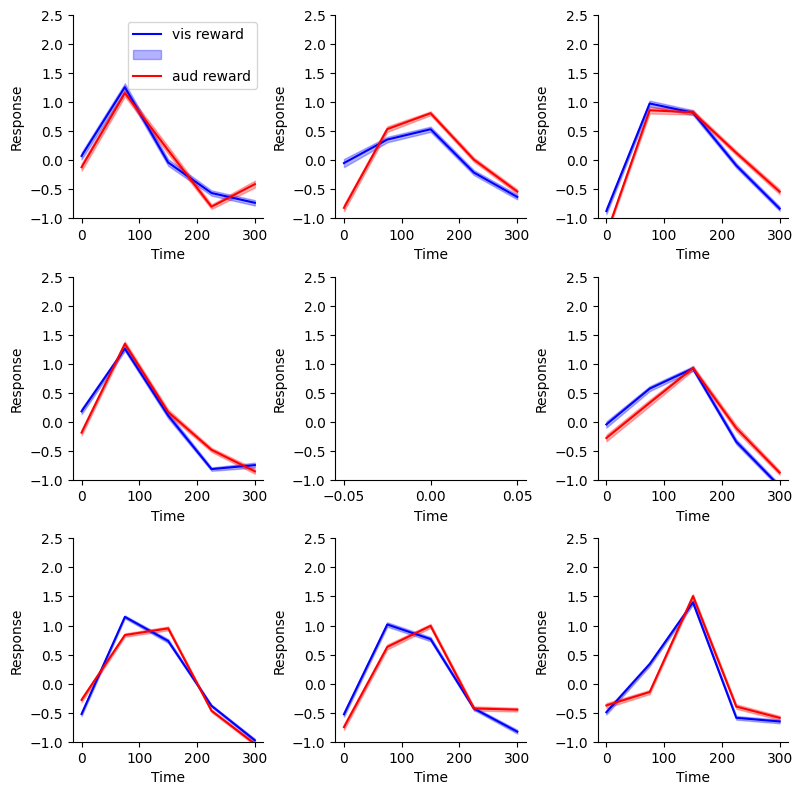

In [34]:
fig, axes = plt.subplots(3,3,figsize = (8,8))
#fig.suptitle(mouse_id + ' cluster topography', fontsize=16)
for i in range(len(arm1_vis_reward_beta_by_day)):
    row = i//3
    column = i%3
    ax = axes[row,column]
    plot_with_error_shading(data = arm2_vis_reward_beta_by_day[i], time_points = neuron_data['beta_timepoint'], ax=ax, ymax=2.5, ymin=-1, color='b')
    plot_with_error_shading(data = arm2_aud_reward_beta_by_day[i], time_points = neuron_data['beta_timepoint'], ax=ax, ymax=2.5, ymin=-1, color='r')
axes[0,0].legend(['vis reward','','aud reward'])
plt.tight_layout()
fig.savefig(os.path.join(mouse_path, 'figures', 'arm2_vis_reward_vs_aud_reward.png'),
            dpi=300,               # High resolution for publication
            bbox_inches='tight',   # Prevent clipping
            )
